In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from pyuvdata import UVCal
from pyuvdata import UVData
import glob
import aipy
from hera_qm import ant_metrics
from hera_cal import omni, utils, firstcal, datacontainer
from matplotlib.colors import LogNorm
import sys
from copy import deepcopy
import omnical
%matplotlib notebook

In [2]:
pols = ['xx','xy','yx','yy']
antpols = ['x','y']
origin = './'
time = '2457555.42443'
day = time.split('.')[0]
dataFileList = [origin + day + '/zen.' + time + '.' + pol + '.HH.uvc' for pol in pols]
ant_metrics_json = origin + day + '/zen.' + time + '.HH.uvc.ant_metrics.json'
fcFileList = [origin + day + '/zen.' + time + '.' + pol + '.HH.uvc.first.calfits' for pol in [pols[0],pols[3]]]
omnicalFile = origin + day + '/zen.' + time + '.HH.uvc.omni.calfits'
omniVisFile = origin + day + '/zen.' + time + '.HH.uvc.vis.uvfits'

In [3]:
omnicalFile

'./2457555/zen.2457555.42443.HH.uvc.omni.calfits'

In [17]:
data = UVData()
data.read_miriad(dataFileList)

<IPython.core.display.Javascript object>


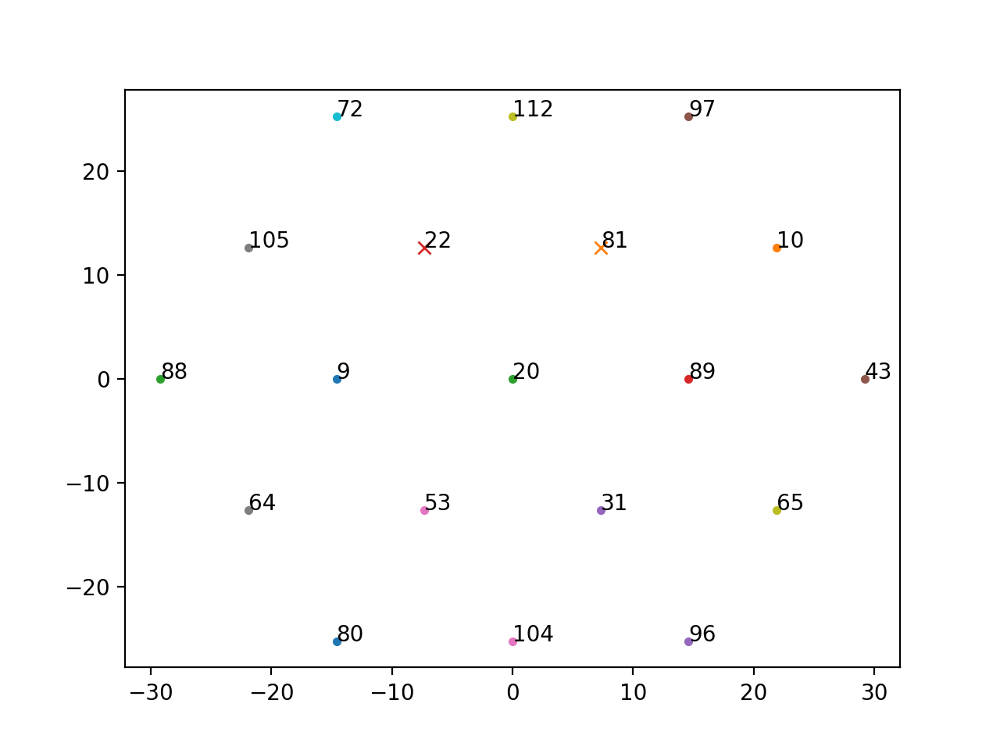

In [18]:
calfile = 'hsa7458_v001'
freqs = data.freq_array[0,:] / 1e9
am = ant_metrics.load_antenna_metrics(ant_metrics_json)
aa = utils.get_aa_from_calfile(freqs[0], calfile)
ex_ants = list(set([ant[0] for ant in am['xants']]))


info = omni.aa_to_info(aa, pols=['x','y'], crosspols=['xx','yy'])#, ex_ants=ex_ants)
reds = info.get_reds()

plt.figure()
antpos = {}
for ant in data.get_ants():
    pos = info.antloc[info.ant_index(ant)]
    antpos[ant] = pos
    if ant in ex_ants:
        plt.plot(pos[0],pos[1],'x')
    else: 
        plt.plot(pos[0],pos[1],'.')        
    plt.text(pos[0],pos[1], str(ant))



In [19]:
for i,red in enumerate(reds): 
    if len(red) > 6: print i,len(red), red[0]#, antpos[red[0][0]] - antpos[red[0][1]]
redToPlot = reds[15]

1 14 (9, 53)
2 14 (9, 20)
6 10 (9, 80)
13 10 (10, 112)
15 9 (10, 22)
19 9 (10, 31)
20 10 (9, 81)
23 9 (20, 72)
24 14 (9, 64)
28 14 (137, 181)
29 14 (137, 148)
33 10 (137, 208)
40 10 (138, 240)
42 9 (138, 150)
46 9 (138, 159)
47 10 (137, 209)
50 9 (148, 200)
51 14 (137, 192)


# Plotting

In [20]:
def plot_reds(dc, redToPlot, cbarlabel):
    #with plt.style.context(('dark_background')):
    with plt.style.context(('classic')):
        fig, axes = plt.subplots(len(redToPlot)/2, 2, sharex=True, sharey=True, figsize = (10,6))
        for i,(bl, ax) in enumerate(zip(redToPlot, axes.flatten())):
            im = ax.imshow(np.angle(dc[bl]['xx']), cmap='inferno', aspect='auto', extent=[100,200,51,0])
            ax.text(101-.2,48-.7,str(bl), color='k', fontsize = 16)
            ax.text(101,48,str(bl), color='w', fontsize = 16)
            if i >= len(axes.flatten())-2:
                ax.set_xlabel('Frequency (MHz)', size=14)
            ax.set_yticks([])
            ax.tick_params(labelsize=14)
        plt.tight_layout()
        cbar = fig.colorbar(im,  ax=axes.ravel().tolist(), orientation='horizontal', label=cbarlabel, aspect=40)
        cbar.ax.xaxis.label.set_font_properties(matplotlib.font_manager.FontProperties(size=14))
        cbar.ax.tick_params(labelsize=14) 

# Raw Data

[(10, 22), (20, 88), (31, 64), (81, 105), (89, 9), (43, 20), (65, 53), (97, 72), (96, 80)]


<IPython.core.display.Javascript object>


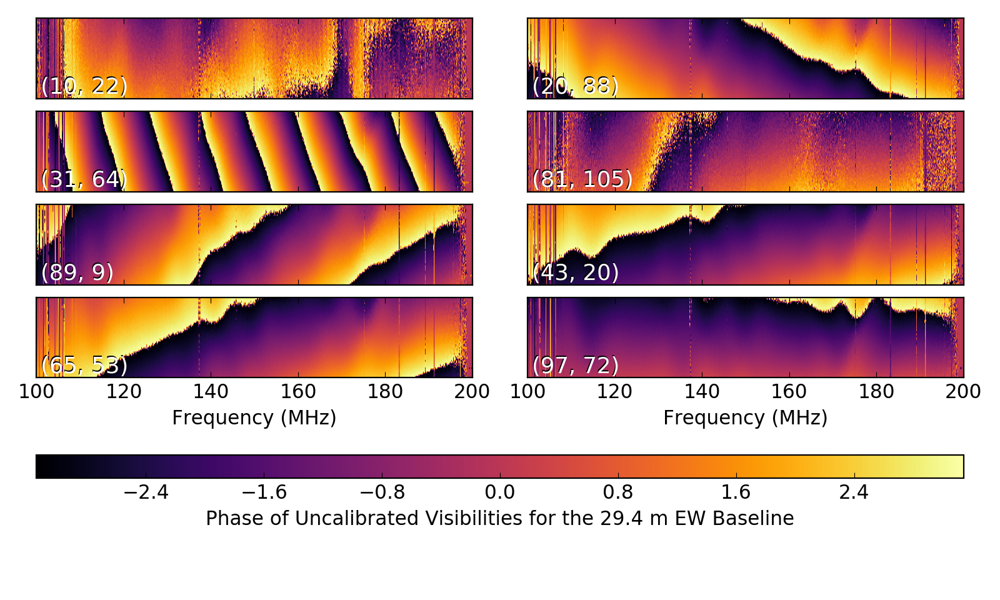

[(10, 22), (20, 88), (31, 64), (81, 105), (89, 9), (43, 20), (65, 53), (97, 72), (96, 80)]


In [21]:
print redToPlot
datapack, wgtpack = firstcal.UVData_to_dict([data])
dc = datacontainer.DataContainer(datapack)
plot_reds(dc, redToPlot,'Phase of Uncalibrated Visibilities for the 29.4 m EW Baseline')
print redToPlot
plt.savefig('raw.pdf')

# ex_ants

<IPython.core.display.Javascript object>


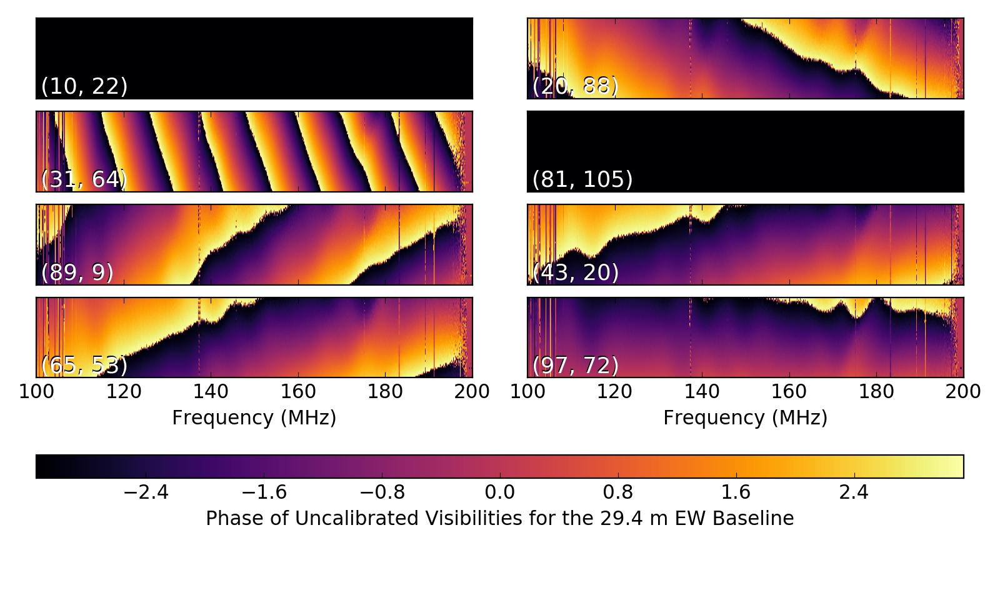

In [22]:
datapack2 = deepcopy(datapack)
for (ant1,ant2) in datapack2.keys():
    if ant1 in ex_ants or ant2 in ex_ants:
        for pol in datapack2[(ant1,ant2)].keys():
            datapack2[(ant1,ant2)][pol] = np.zeros_like(datapack2[(ant1,ant2)][pol])
dc_ex_ant = datacontainer.DataContainer(datapack2)
plot_reds(dc_ex_ant, redToPlot,'Phase of Uncalibrated Visibilities for the 29.4 m EW Baseline')
plt.savefig('ex_ants.pdf')

# Perform Firstcal

<IPython.core.display.Javascript object>


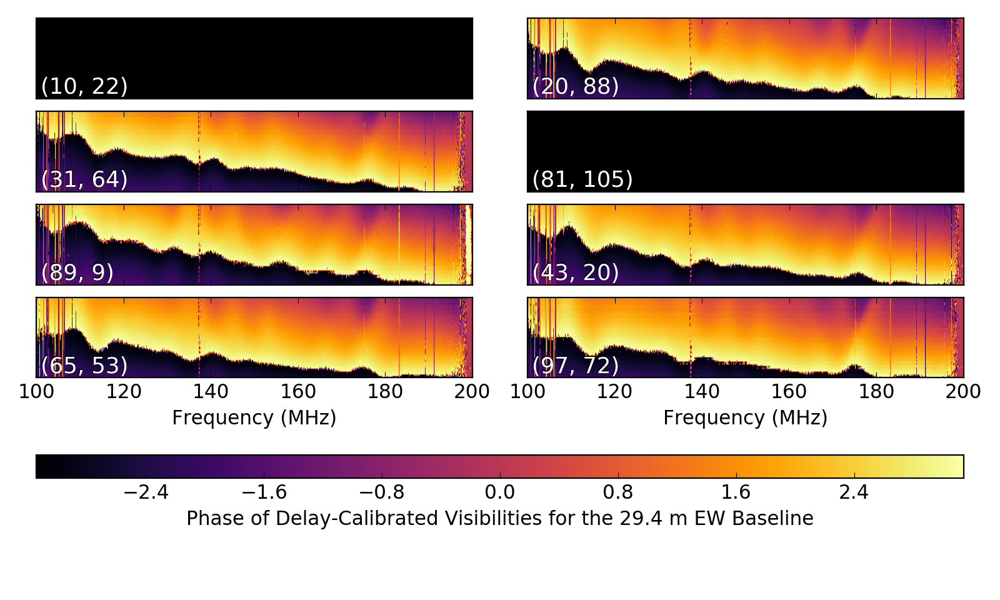

<IPython.core.display.Javascript object>


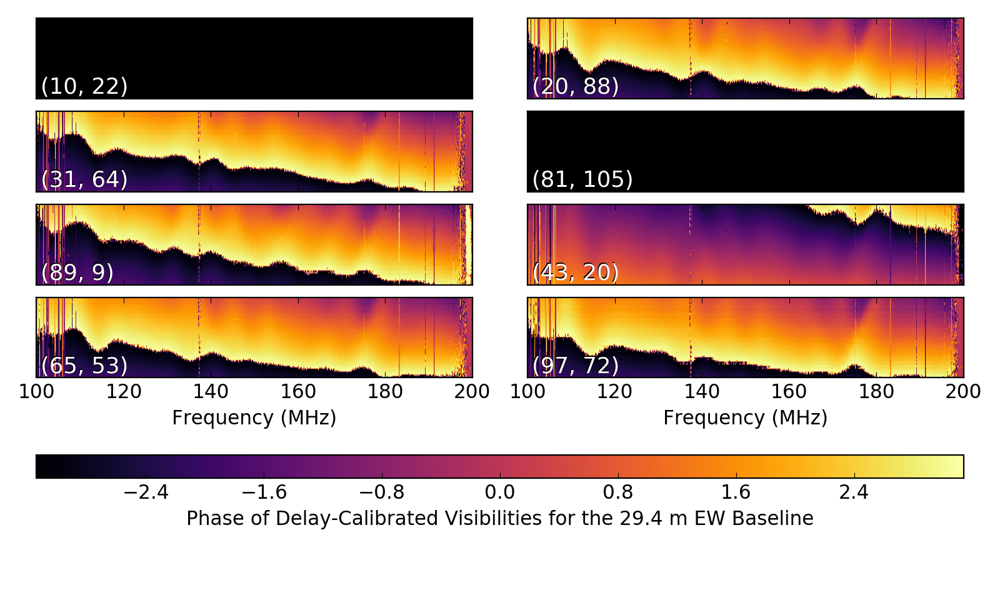

In [23]:
datapack3 = deepcopy(datapack2)
fc = UVCal()
fc.read_calfits(fcFileList[0])
fc_x_gains = {ant: fc.gain_array[i,0,:,:,0].T for i,ant in enumerate(fc.ant_array)}
for (ant1,ant2) in datapack3.keys():
    if ant1 not in ex_ants and ant2 not in ex_ants:
        datapack3[(ant1,ant2)]['xx'] = datapack3[(ant1,ant2)]['xx'] / fc_x_gains[ant1] / np.conj(fc_x_gains[ant2])
dc_fc = datacontainer.DataContainer(datapack3)
plot_reds(dc_fc, redToPlot,'Phase of Delay-Calibrated Visibilities for the 29.4 m EW Baseline')
plt.savefig('fc.pdf')

for (ant1,ant2) in datapack3.keys():
    if ant1 == 43 or ant2==43:
        datapack3[(ant1,ant2)]['xx'] *= -1
dc_fc = datacontainer.DataContainer(datapack3)
plot_reds(dc_fc, redToPlot,'Phase of Delay-Calibrated Visibilities for the 29.4 m EW Baseline')
plt.savefig('fc_flipped.pdf')


# Perform Omnical

In [24]:
info = omni.aa_to_info(aa, pols=['x','y'], crosspols=['xx','yy'], ex_ants=ex_ants)
reds = info.get_reds()
_, g0, _, _ = omni.from_fits(fcFileList) #check and see if this is the same as aaron

./2457555/zen.2457555.42443.xx.HH.uvc.first.calfits
./2457555/zen.2457555.42443.yy.HH.uvc.first.calfits


In [25]:
datapack, wgtpack = firstcal.UVData_to_dict([data])
for bl in datapack.keys():
    for pol in datapack[bl].keys():
        datapack[bl][pol] = np.array(datapack[bl][pol], dtype=np.complex64)
for antpol in g0.keys():
    for ant in g0[antpol].keys():
        g0[antpol][ant] = np.array(g0[antpol][ant], dtype=np.complex64)        
m1, g1, v1 = omnical.calib.logcal(datapack, info, gains=g0)
m2, g2, v2 = omnical.calib.lincal(datapack, info, gains=g1, vis=v1)
g3, v3 = omni.remove_degen(info, g2, v2, g0, minV=False)

<IPython.core.display.Javascript object>


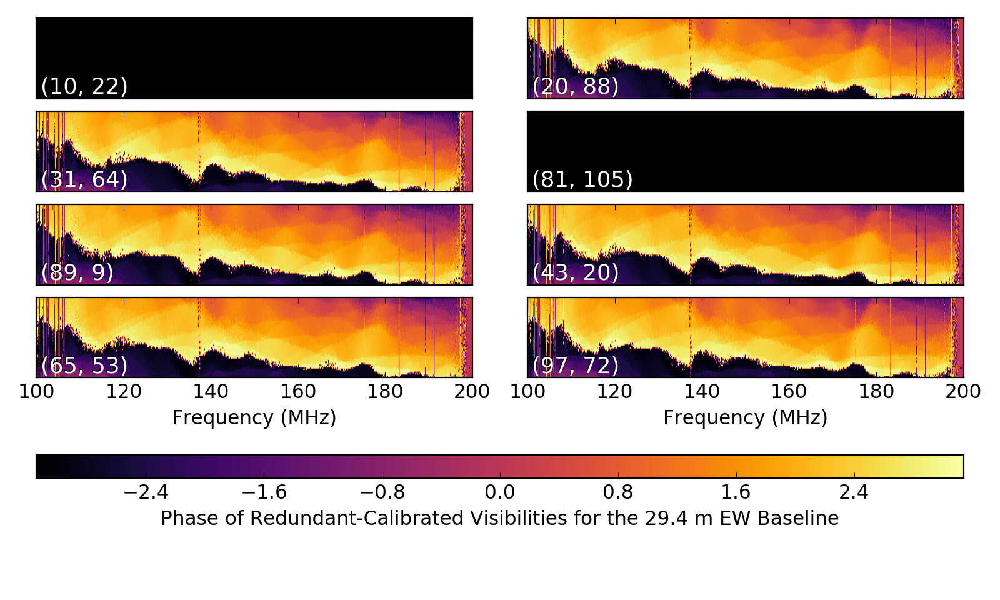

<IPython.core.display.Javascript object>


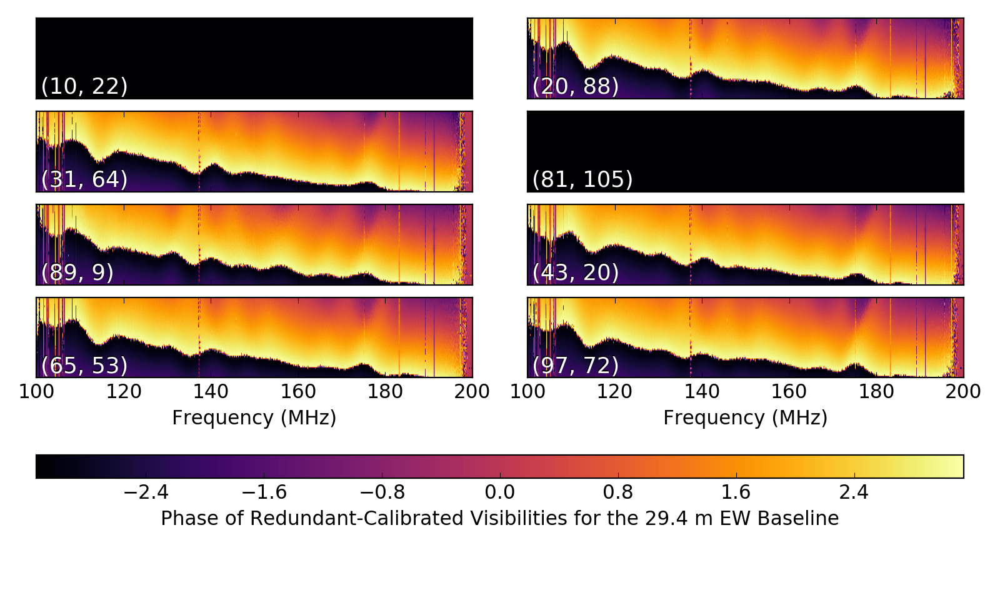

In [26]:
datapack4 = deepcopy(datapack2)
oc = UVCal()
oc.read_calfits(omnicalFile)
oc_gains = {ant: oc.gain_array[i,0,:,:,1].T for i,ant in enumerate(oc.ant_array)}
for (ant1,ant2) in datapack4.keys():
    if ant1 not in ex_ants and ant2 not in ex_ants:
        #datapack4[(ant1,ant2)]['xx'] = datapack4[(ant1,ant2)]['xx'] / oc_gains[ant1] / np.conj(oc_gains[ant2])
        datapack4[(ant1,ant2)]['xx'] = datapack4[(ant1,ant2)]['xx'] / g2['x'][ant1] / np.conj(g2['x'][ant2])
        
dc_oc = datacontainer.DataContainer(datapack4)
plot_reds(dc_oc, redToPlot,'Phase of Redundant-Calibrated Visibilities for the 29.4 m EW Baseline')
plt.savefig('oc_no_rd.pdf')


datapack4 = deepcopy(datapack2)
oc = UVCal()
oc.read_calfits(omnicalFile)
oc_gains = {ant: oc.gain_array[i,0,:,:,1].T for i,ant in enumerate(oc.ant_array)}
for (ant1,ant2) in datapack4.keys():
    if ant1 not in ex_ants and ant2 not in ex_ants:
        #datapack4[(ant1,ant2)]['xx'] = datapack4[(ant1,ant2)]['xx'] / oc_gains[ant1] / np.conj(oc_gains[ant2])
        datapack4[(ant1,ant2)]['xx'] = datapack4[(ant1,ant2)]['xx'] / g3['x'][ant1] / np.conj(g3['x'][ant2])
        
dc_oc = datacontainer.DataContainer(datapack4)
plot_reds(dc_oc, redToPlot,'Phase of Redundant-Calibrated Visibilities for the 29.4 m EW Baseline')
plt.savefig('oc.pdf')

In [27]:
oc_antpols = [aipy.miriad.pol2str[index][0] for index in oc.jones_array]
print oc_antpols

['y', 'x']


<IPython.core.display.Javascript object>


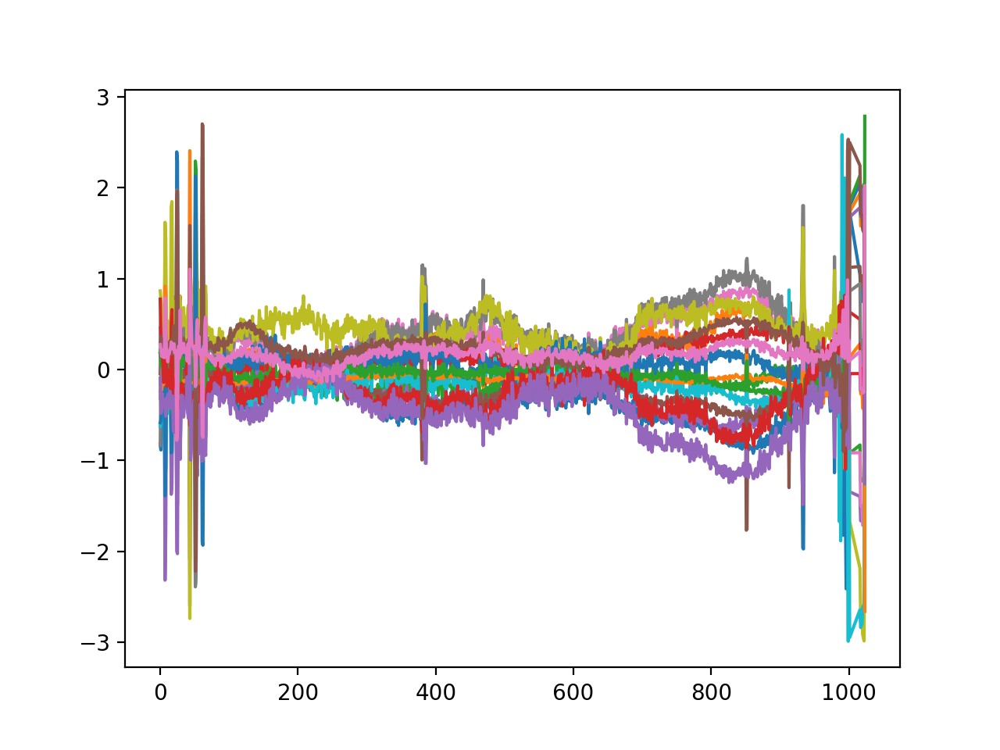

In [28]:
plt.figure()
for ant in oc_gains.keys():
    plt.plot(np.angle(oc_gains[ant][0,:] / fc_x_gains[ant][0,:]))

<IPython.core.display.Javascript object>


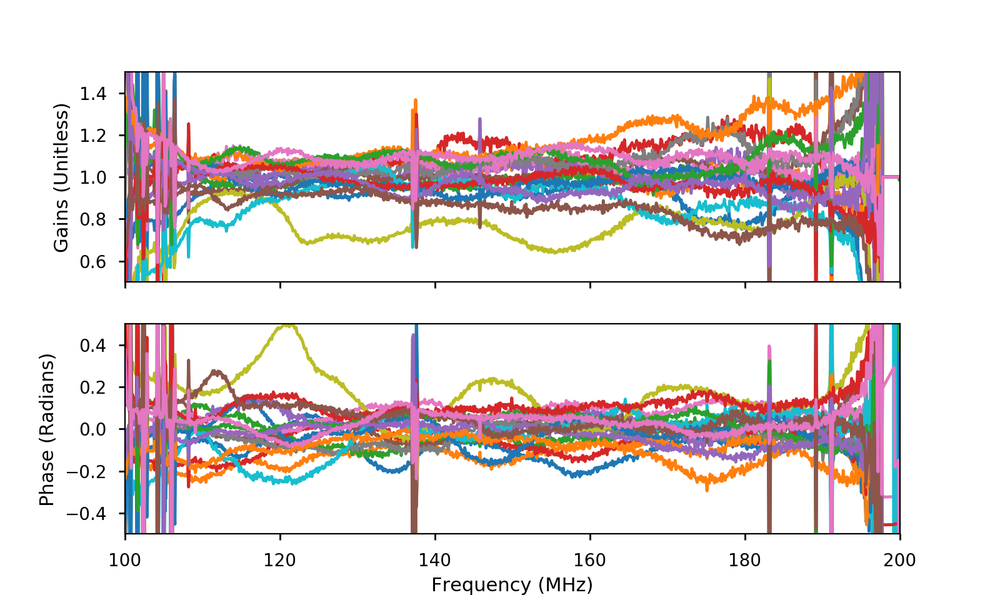

In [33]:
start = 0
stop = 1024
#with plt.style.context(('dark_background')):
with plt.style.context(('seaborn-notebook')):
    fig, axes = plt.subplots(2,1,sharex=True, figsize = (10*.8,6*.8))
    ax = axes[0]
    for ant in g3['x'].keys():
        ax.plot(1e3*freqs[start:stop],np.abs(np.mean(g3['x'][ant][0:1,start:stop] / fc_x_gains[ant][0:1,start:stop], axis=0)),label=ant)
    ax.set_ylim([.5,1.5])
    ax.set_xlim([100,200])
    ax.set_ylabel('Gains (Unitless)')
    
    ax = axes[1]
    for ant in g3['x'].keys():
        ax.plot(1e3*freqs[start:stop],np.angle(np.mean(g3['x'][ant][0:1,start:stop] / fc_x_gains[ant][0:1,start:stop], axis=0)),label=ant)
    ax.set_ylim([-.5,.5])
    ax.set_xlim([100,200])
    ax.set_ylabel('Phase (Radians)')
    ax.set_xlabel('Frequency (MHz)')

plt.savefig('average_gains.pdf')

In [62]:
g3['x'].keys()

[64, 65, 112, 97, 72, 9, 10, 43, 96, 80, 104, 20, 53, 105, 88, 89, 31]

<IPython.core.display.Javascript object>


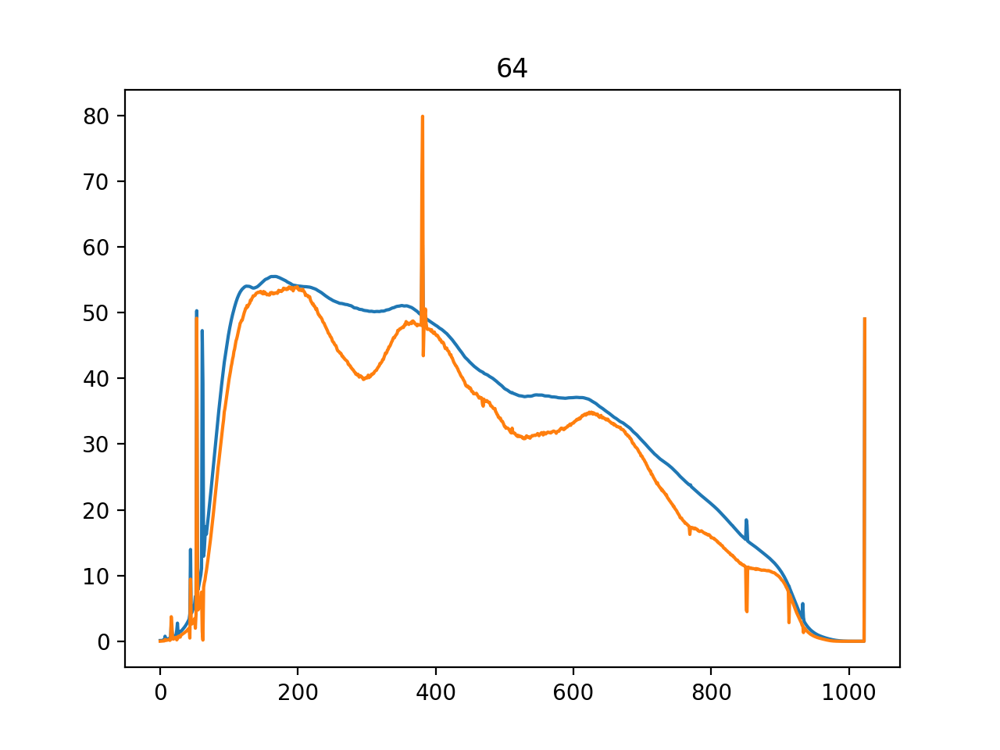

<IPython.core.display.Javascript object>


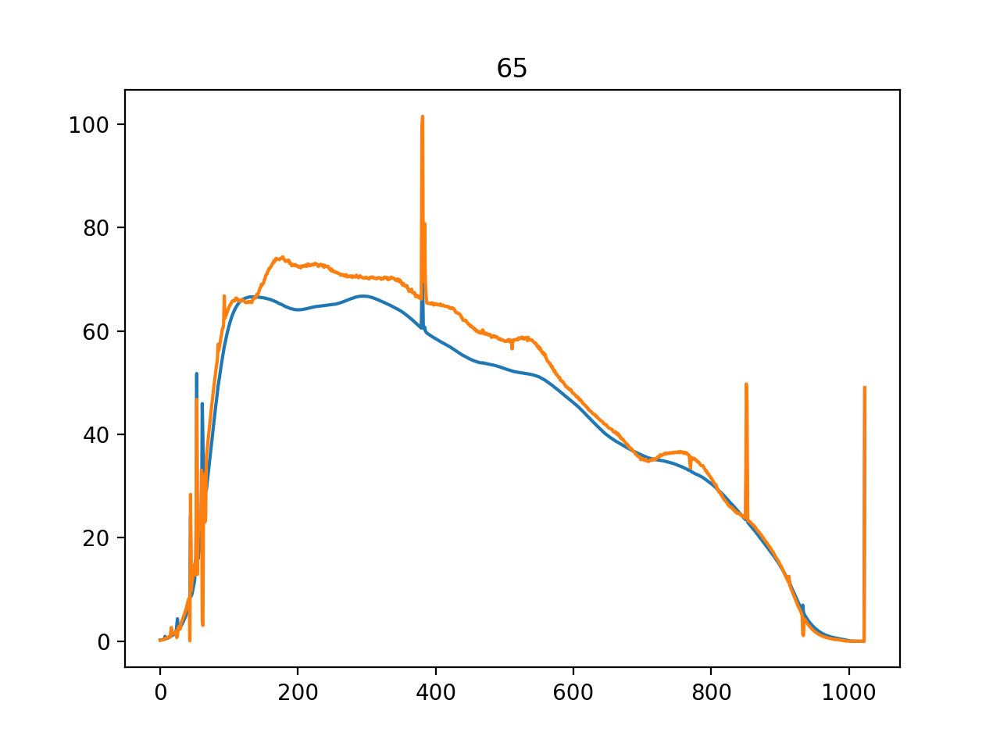

<IPython.core.display.Javascript object>


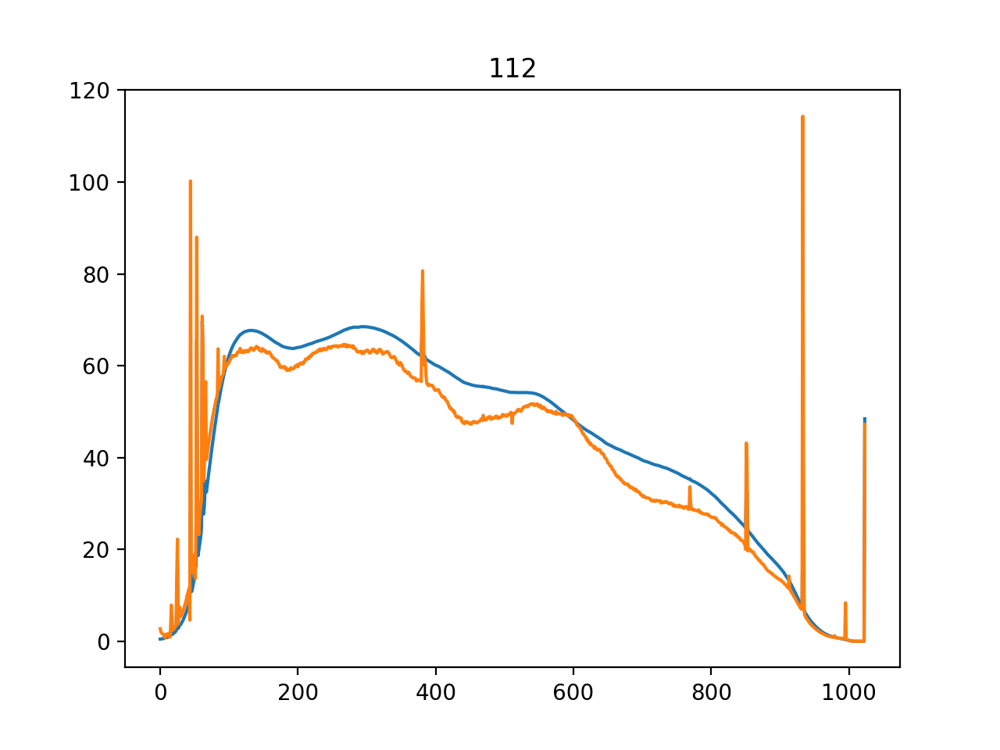

<IPython.core.display.Javascript object>


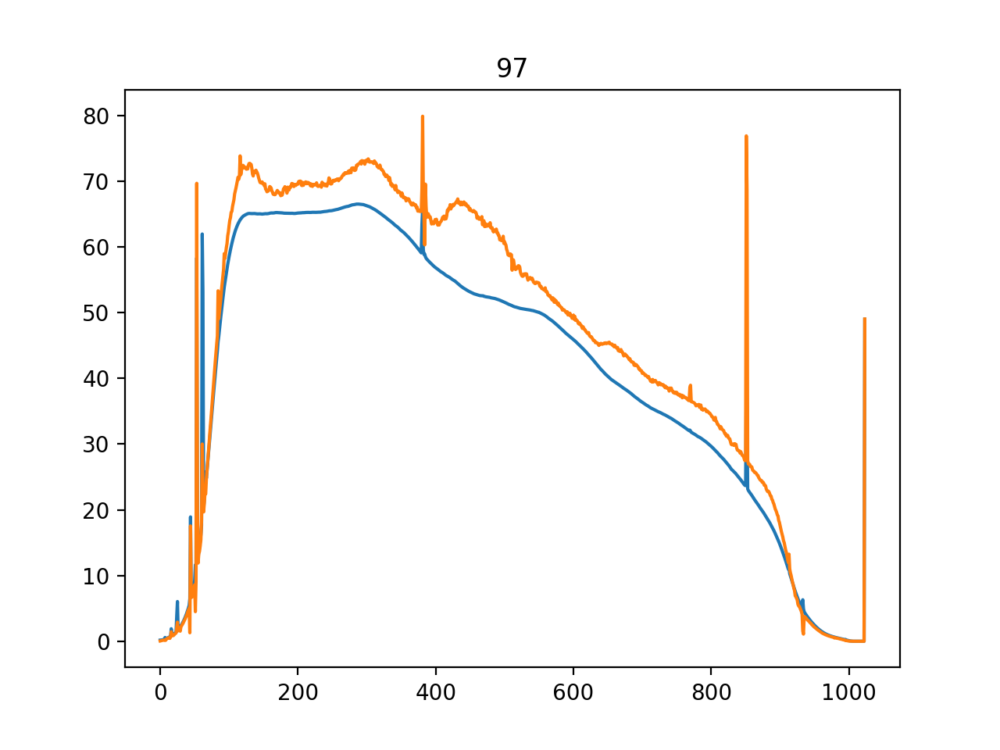

<IPython.core.display.Javascript object>


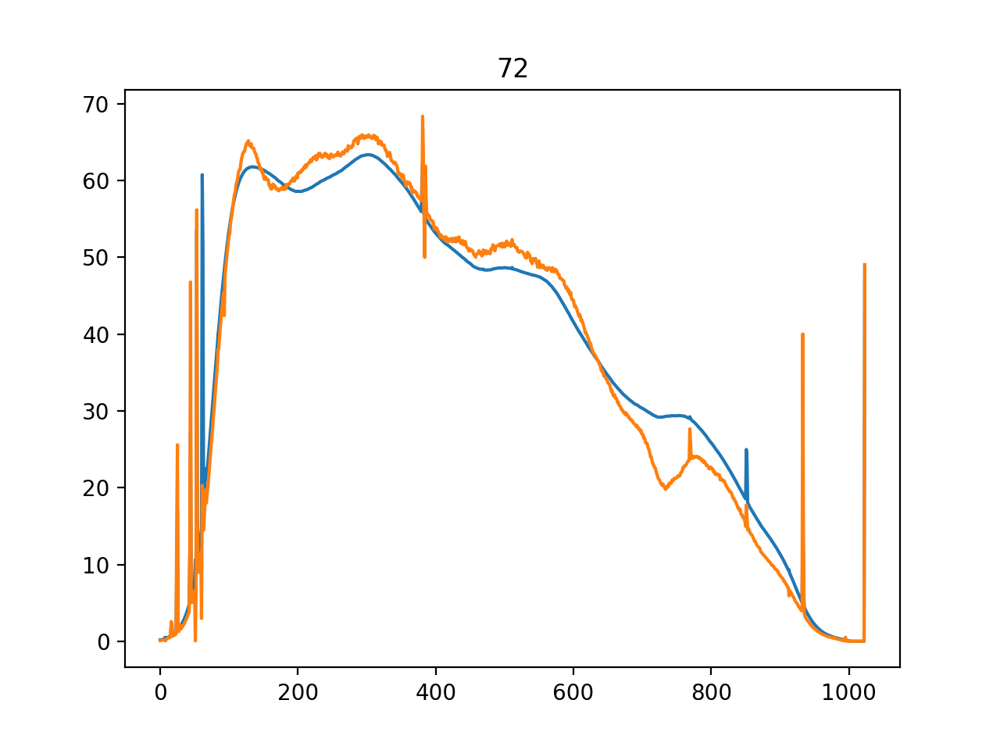

<IPython.core.display.Javascript object>


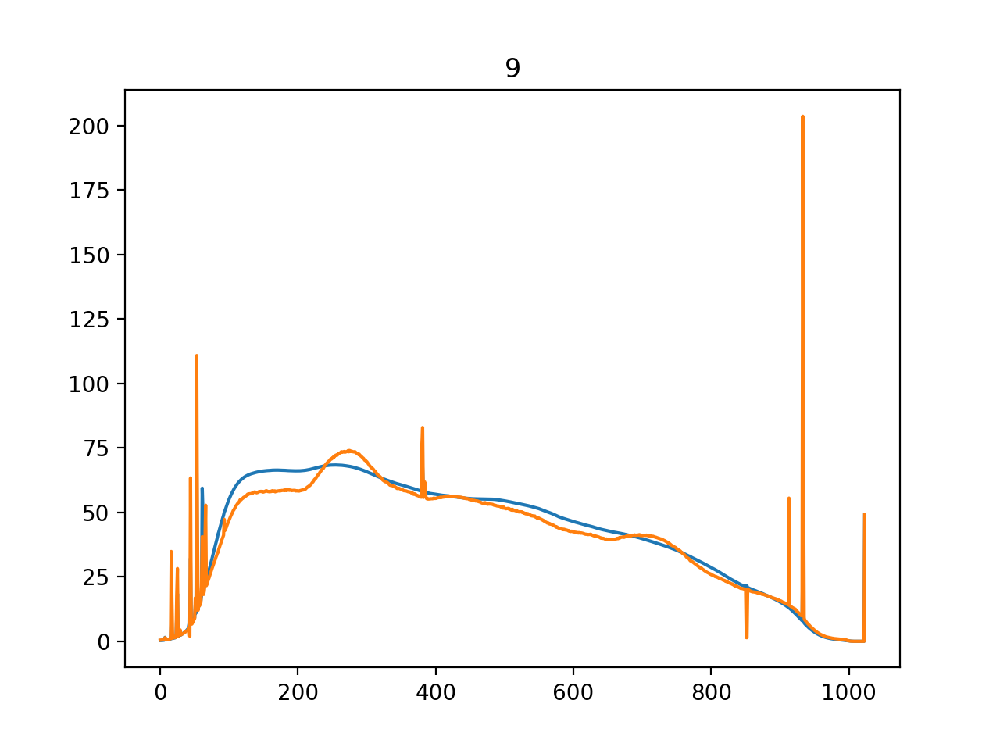

<IPython.core.display.Javascript object>


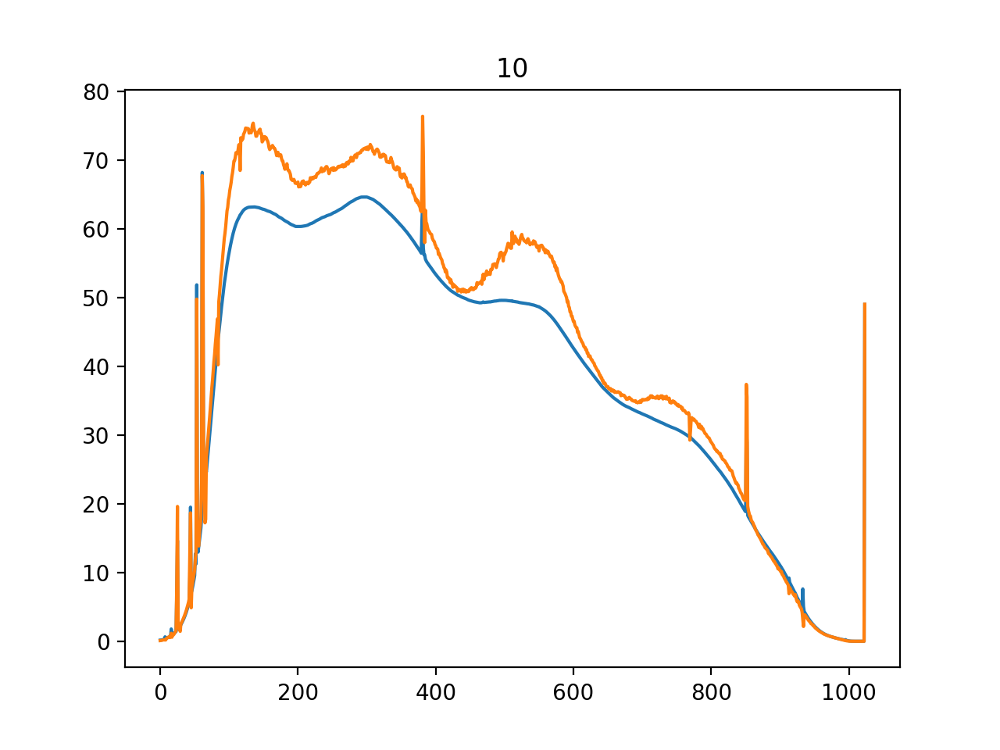

<IPython.core.display.Javascript object>


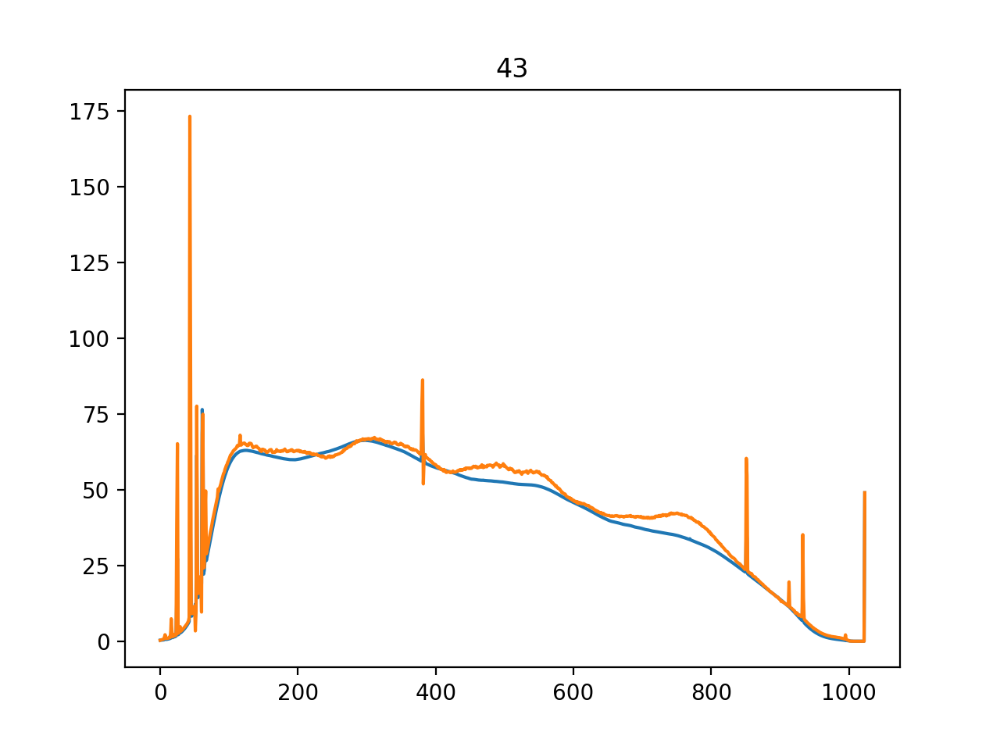

<IPython.core.display.Javascript object>


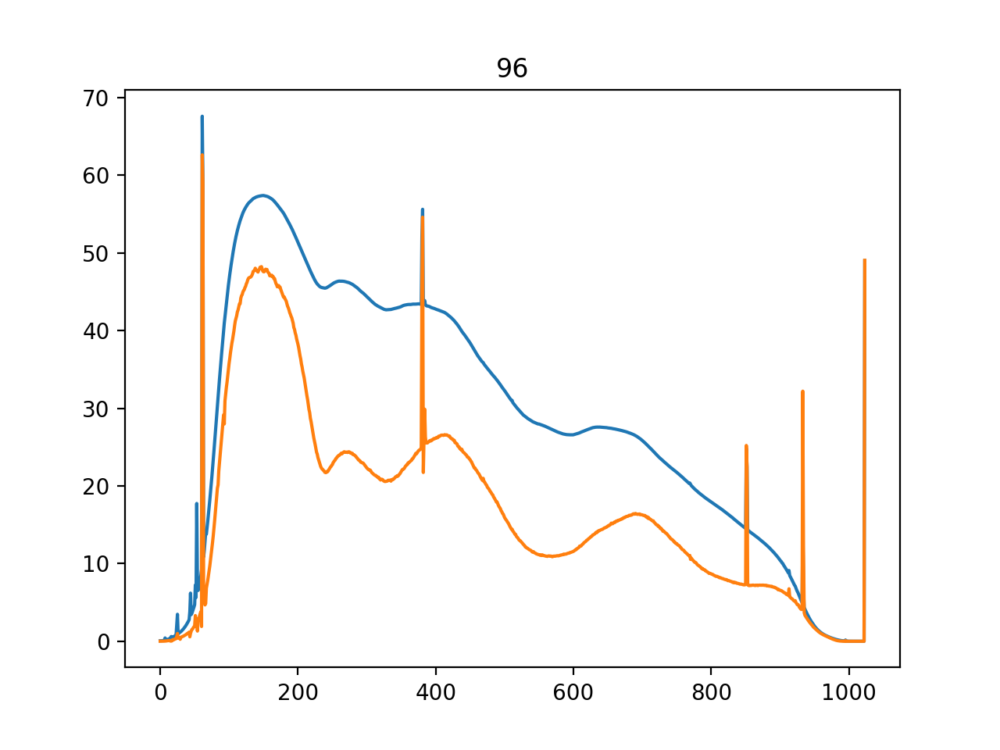

<IPython.core.display.Javascript object>


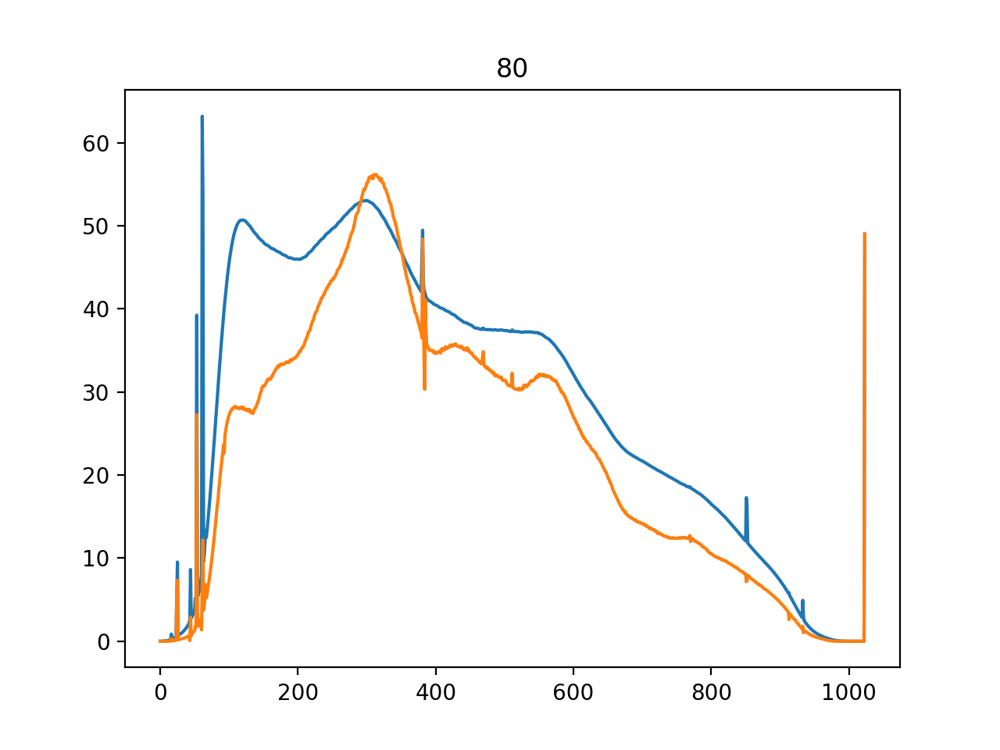

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


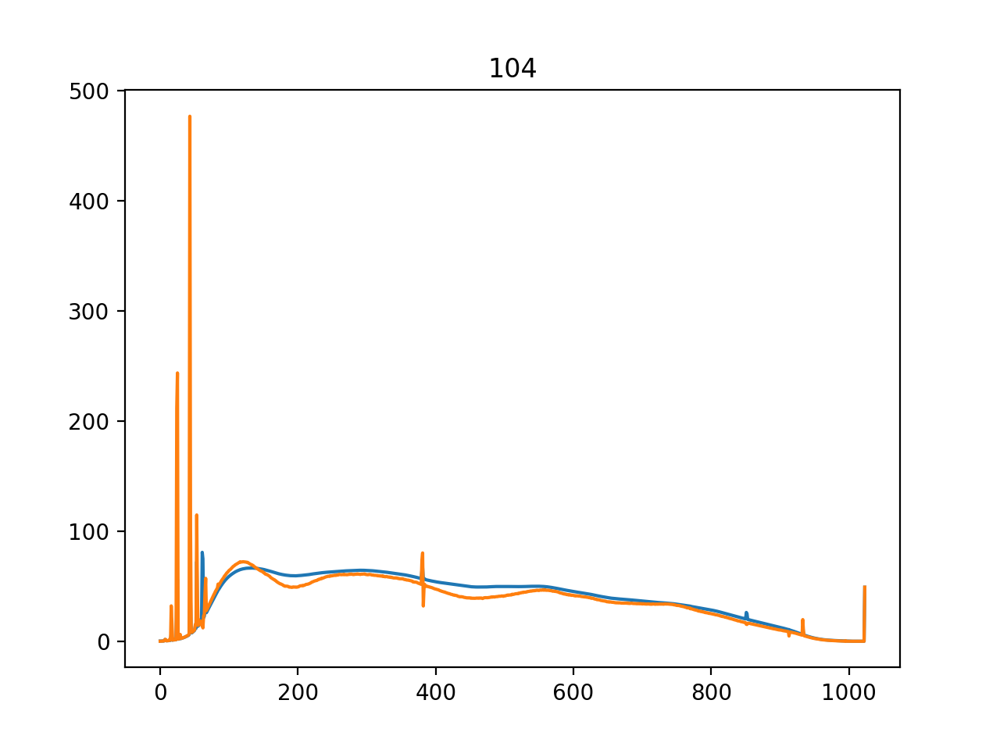

<IPython.core.display.Javascript object>


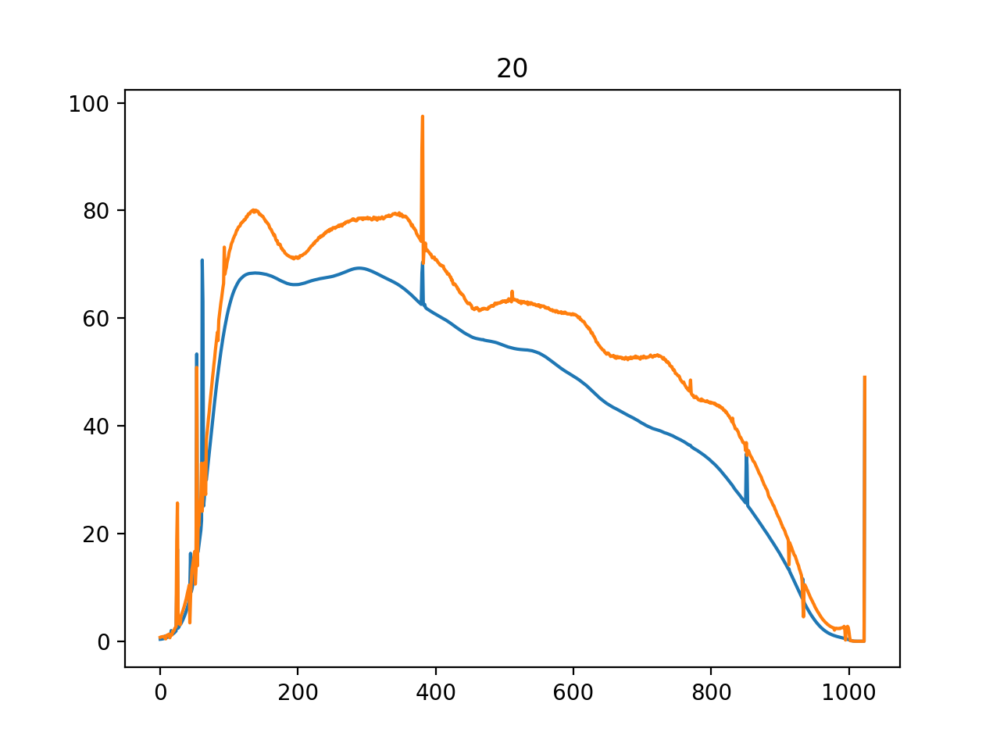

<IPython.core.display.Javascript object>


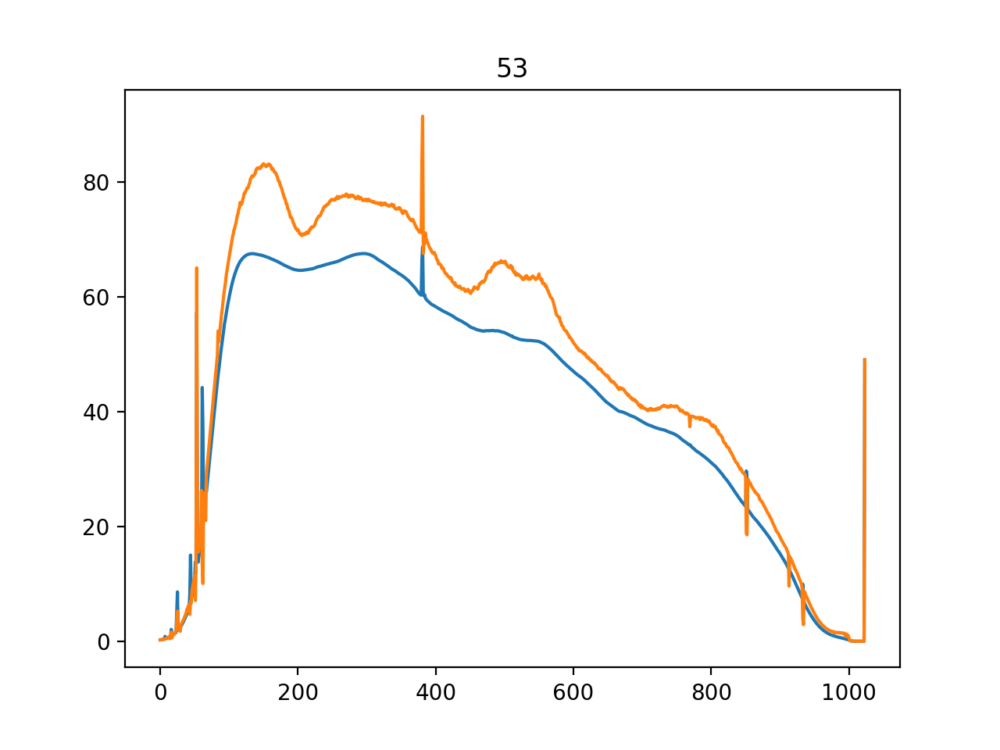

<IPython.core.display.Javascript object>


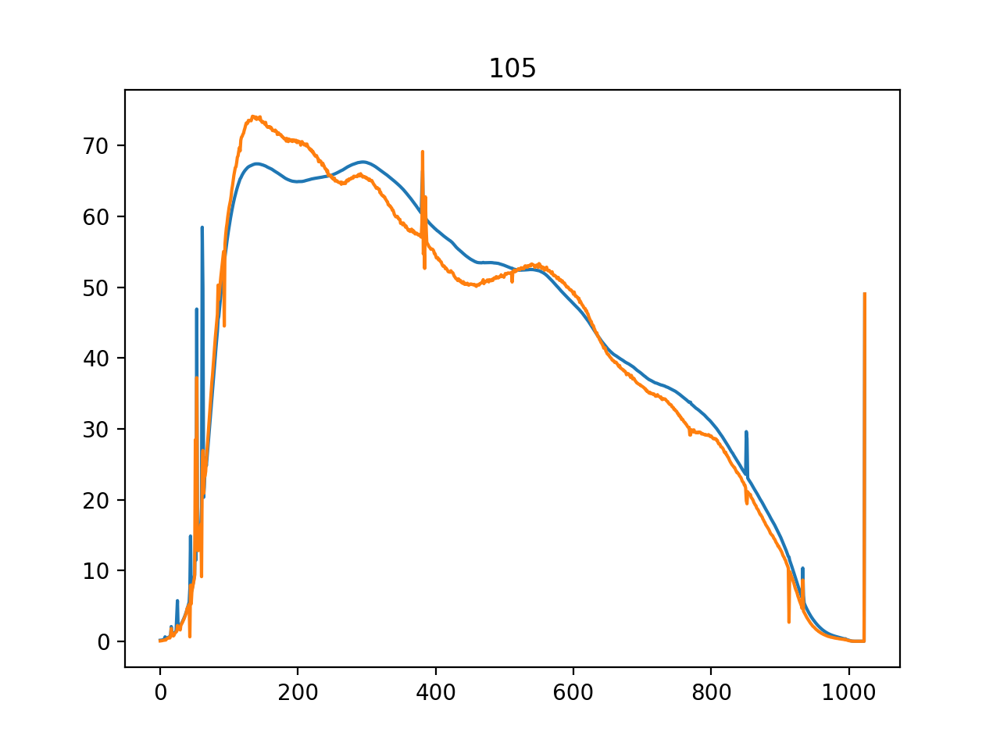

<IPython.core.display.Javascript object>


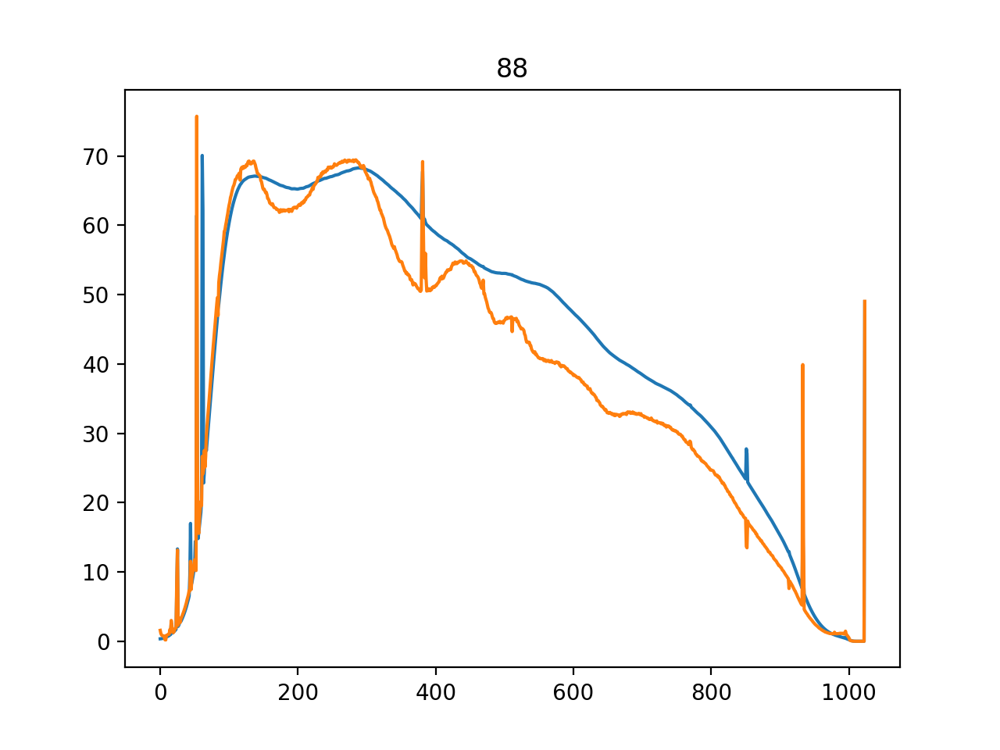

<IPython.core.display.Javascript object>


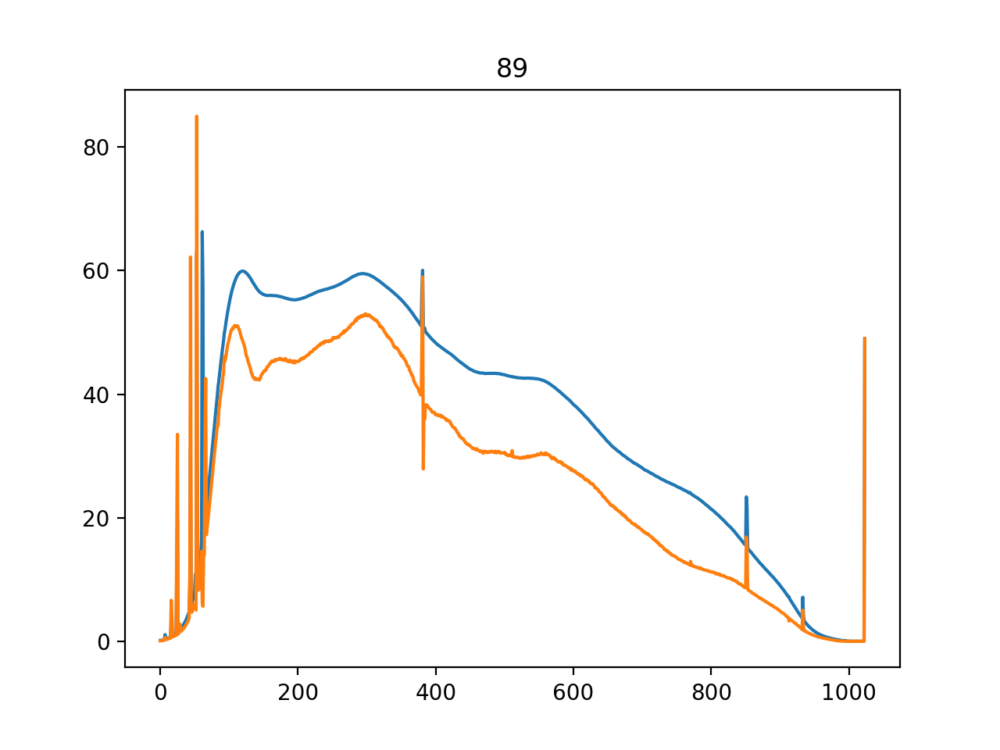

<IPython.core.display.Javascript object>


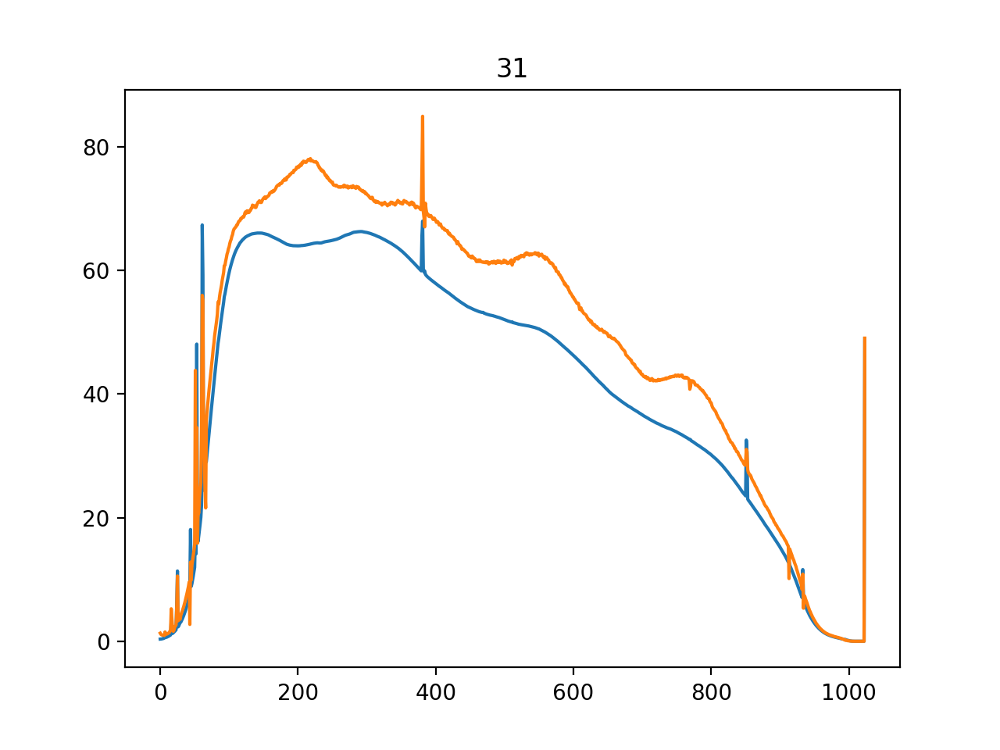

In [70]:
for ant in g3['x'].keys():

    plt.figure()
    plt.plot(np.mean(datapack[ant,ant]['xx'].T,axis=1))
    plt.plot(np.abs(np.mean(g3['x'][ant].T,axis=1))**2 * datapack[ant,ant]['xx'].T[:,0])
    plt.title(ant)

In [30]:
 print(plt.style.available)

[u'seaborn-darkgrid', u'Solarize_Light2', u'seaborn-notebook', u'classic', u'seaborn-ticks', u'grayscale', u'bmh', u'seaborn-talk', u'dark_background', u'ggplot', u'fivethirtyeight', u'_classic_test', u'seaborn-colorblind', u'seaborn-deep', u'seaborn-whitegrid', u'seaborn-bright', u'seaborn-poster', u'seaborn-muted', u'seaborn-paper', u'seaborn-white', u'fast', u'seaborn-pastel', u'seaborn-dark', u'seaborn', u'seaborn-dark-palette']


<IPython.core.display.Javascript object>


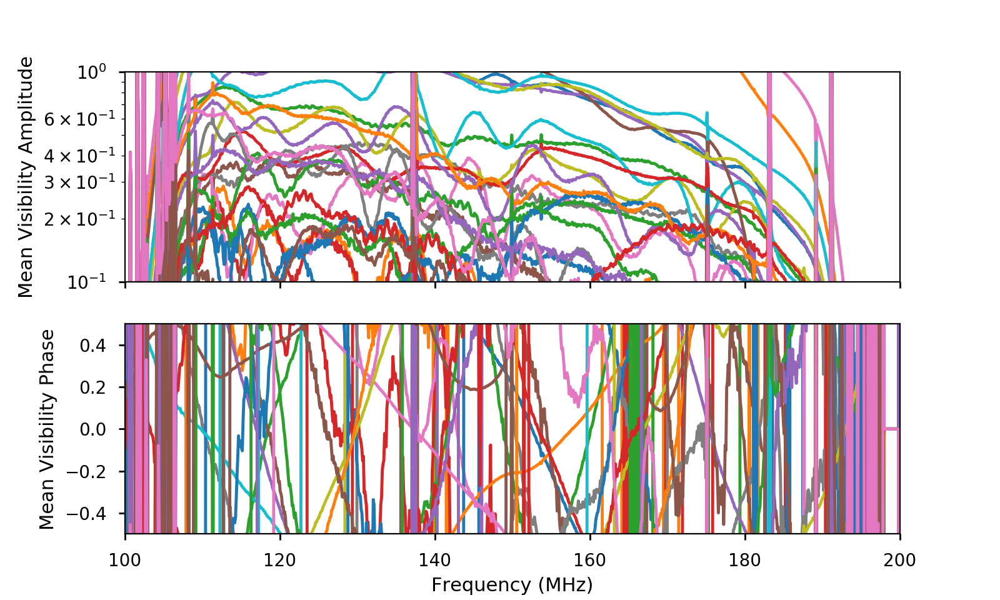

In [31]:
start = 0
stop = 1024
#with plt.style.context(('dark_background')):
with plt.style.context(('seaborn-notebook')):
    fig, axes = plt.subplots(2,1,sharex=True, figsize = (10*.8,6*.8))
    ax = axes[0]
    for bl in v3['xx'].keys():
        ax.semilogy(1e3*freqs[start:stop],np.abs(np.mean(v3['xx'][bl][:,start:stop], axis=0)),label=ant)
    ax.set_ylim([.1,1])
    ax.set_xlim([100,200])
    ax.set_ylabel('Mean Visibility Amplitude')
    
    ax = axes[1]
    for bl in v3['xx'].keys():
        ax.plot(1e3*freqs[start:stop],np.angle(np.mean(v3['xx'][bl][:,start:stop], axis=0)),label=ant)
    ax.set_ylim([-.5,.5])
    ax.set_xlim([100,200])
    ax.set_ylabel('Mean Visibility Phase')
    ax.set_xlabel('Frequency (MHz)')

#plt.savefig('average_gains.pdf')

In [16]:
median_vis = np.median([np.abs(dc[key]) for key in dc.keys() if key[2][0]==key[2][1]])
median_cross = np.median([np.abs(dc[key]) for key in dc.keys() if key[2][0]!=key[2][1]])
print median_vis, median_cross, median_vis/median_cross

0.464334555768 0.116021599613 4.00213888894
